<a href="https://colab.research.google.com/github/AVADHBHALLA/javascript/blob/main/Radio_signal_classification.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
# This Python 3 environment comes with many helpful analytics libraries installed
# It is defined by the kaggle/python Docker image: https://github.com/kaggle/docker-python
# For example, here's several helpful packages to load

import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)

# Input data files are available in the read-only "../input/" directory
# For example, running this (by clicking run or pressing Shift+Enter) will list all files under the input directory

import os
for dirname, _, filenames in os.walk('/kaggle/input'):
    for filename in filenames:
        print(os.path.join(dirname, filename))

# You can write up to 20GB to the current directory (/kaggle/working/) that gets preserved as output when you create a version using "Save & Run All"
# You can also write temporary files to /kaggle/temp/, but they won't be saved outside of the current session

In [82]:
from livelossplot.tf_keras import PlotLossesCallback
import matplotlib.pyplot as plt
import seaborn as sns
import tensorflow as tf
from sklearn.metrics import classification_report, confusion_matrix
from sklearn import metrics
import warnings
warnings.simplefilter("ignore")
np.random.seed(42)
print("Tensorflow Version is :",tf.__version__)

Tensorflow Version is : 2.19.0


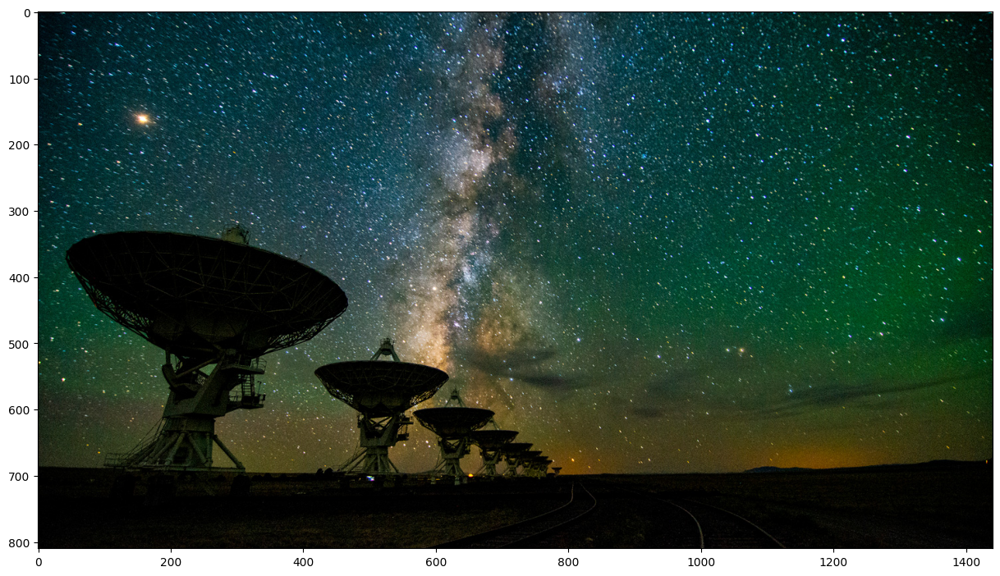

In [10]:
plt.figure(figsize=(15,12))
plt.imshow(plt.imread(r"/content/sample_data/allen.jpg"))

In [12]:
train_images = pd.read_csv("/content/sample_data/images.csv",header=None)
train_labels = pd.read_csv("/content/sample_data/labels.csv",header=None)
val_images = pd.read_csv("/content/sample_data/images(1).csv",header=None)
val_labels = pd.read_csv("/content/sample_data/labels (1).csv",header=None)

In [13]:
train_images.head()

,0,1,2,3,4,5,6,7,8,9,...,8182,8183,8184,8185,8186,8187,8188,8189,8190,8191
0,0.631373,0.623529,0.713726,0.705882,0.658824,0.666667,0.654902,0.635294,0.647059,0.705882,...,0.682353,0.611765,0.650980,0.658824,0.600000,0.603922,0.654902,0.694118,0.658824,0.666667
1,0.725490,0.752941,0.749020,0.701961,0.690196,0.721569,0.709804,0.745098,0.654902,0.721569,...,0.721569,0.698039,0.721569,0.686275,0.713726,0.682353,0.690196,0.698039,0.701961,0.725490
2,0.717647,0.701961,0.713726,0.733333,0.705882,0.717647,0.725490,0.682353,0.717647,0.674510,...,0.709804,0.694118,0.705882,0.682353,0.639216,0.713726,0.670588,0.678431,0.737255,0.674510
3,0.705882,0.674510,0.654902,0.678431,0.666667,0.662745,0.678431,0.662745,0.686275,0.686275,...,0.639216,0.662745,0.631373,0.643137,0.705882,0.662745,0.705882,0.666667,0.654902,0.631373
4,0.647059,0.729412,0.701961,0.674510,0.611765,0.698039,0.713726,0.662745,0.701961,0.674510,...,0.639216,0.670588,0.705882,0.674510,0.721569,0.694118,0.674510,0.705882,0.749020,0.729412


In [14]:
train_labels.head()

,0,1,2,3
0,1.0,0.0,0.0,0.0
1,1.0,0.0,0.0,0.0
2,1.0,0.0,0.0,0.0
3,1.0,0.0,0.0,0.0
4,1.0,0.0,0.0,0.0


Text(0.5, 1.0, 'Squiggle Radio Signals')

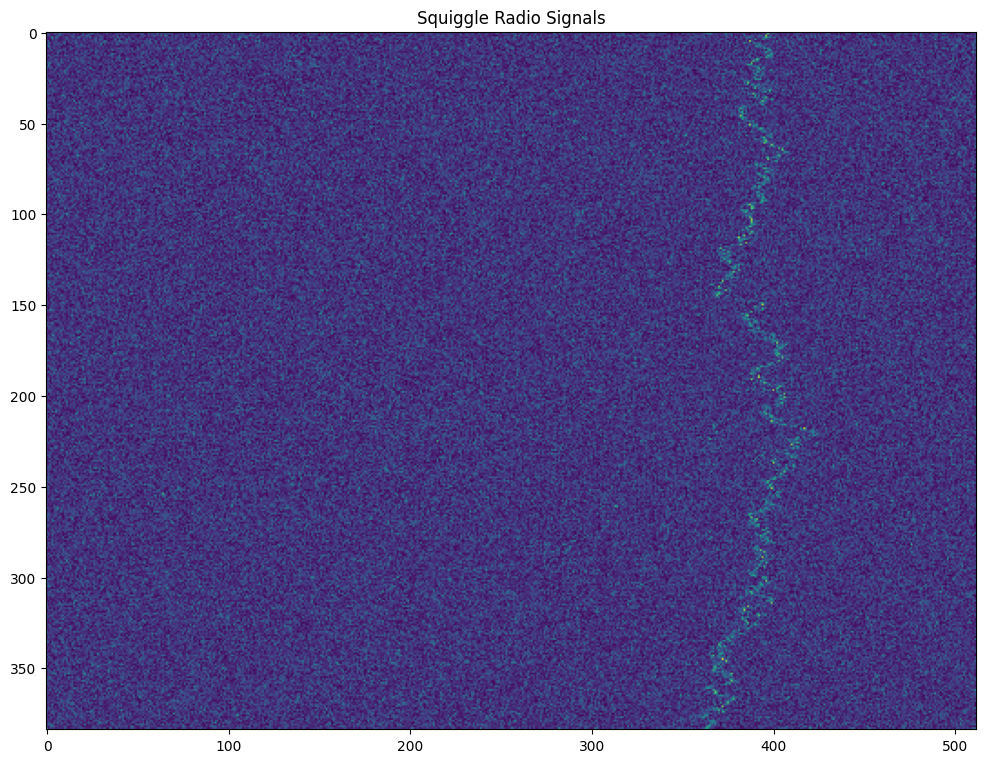

In [17]:
plt.figure(figsize=(12,10))
plt.imshow(plt.imread("/content/sample_data/1015_squiggle.png"))
plt.title("Squiggle Radio Signals")

Text(0.5, 1.0, 'Narrowband Radio Signals')

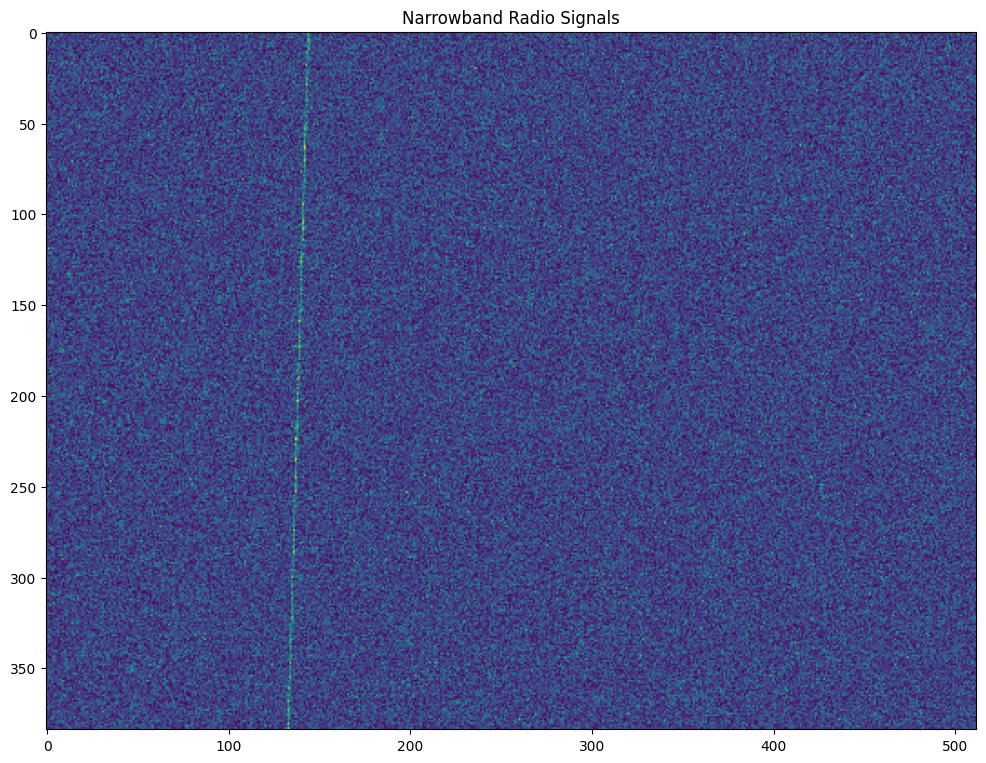

In [18]:
plt.figure(figsize=(12,10))
plt.imshow(plt.imread("/content/sample_data/1012_narrowband.png"))
plt.title("Narrowband Radio Signals")

Text(0.5, 1.0, 'Noises')

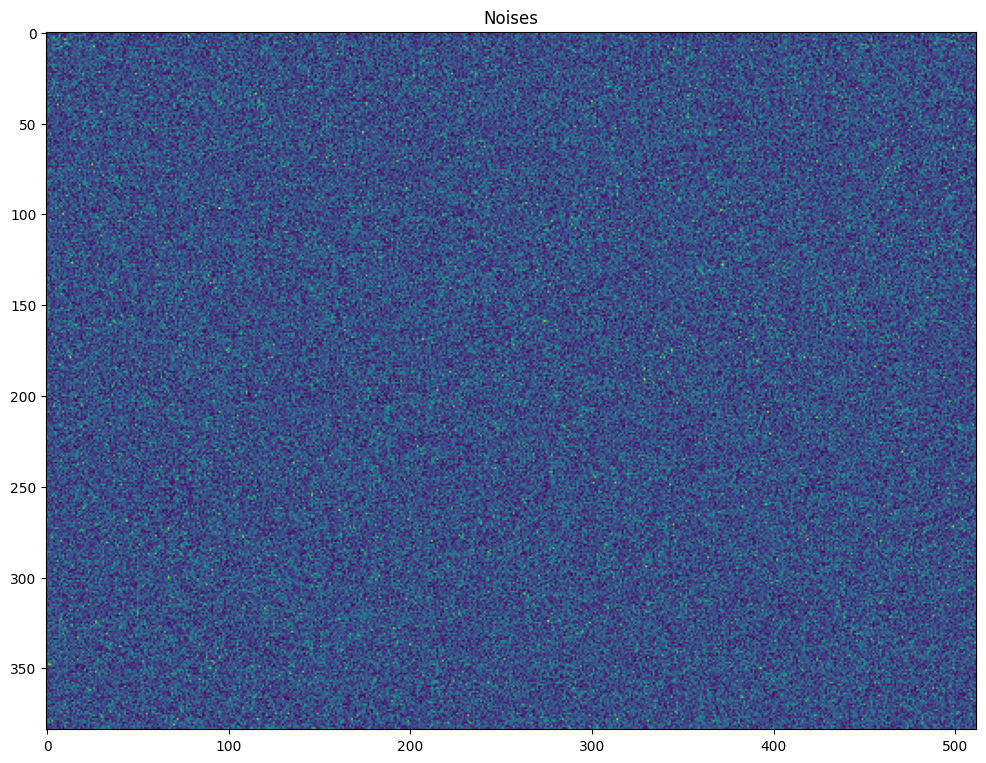

In [19]:
plt.figure(figsize=(12,10))
plt.imshow(plt.imread("/content/sample_data/1001_noise.png"))
plt.title("Noises")

Text(0.5, 1.0, 'Narrowbanddrd Radio Signals')

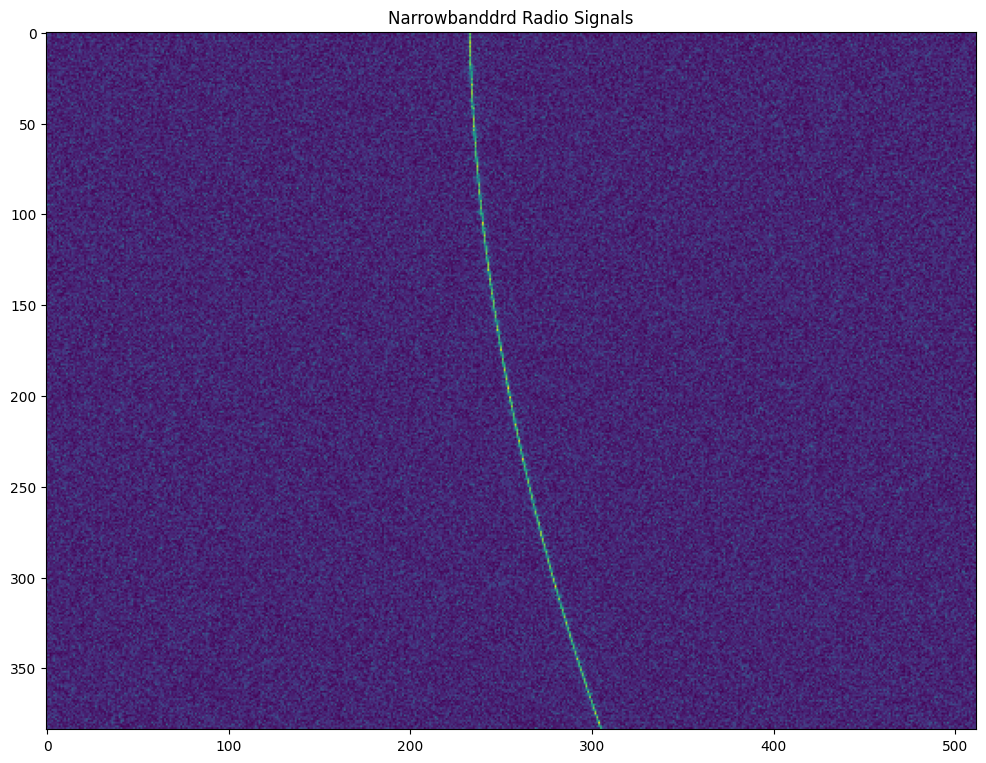

In [20]:
plt.figure(figsize=(12,10))
plt.imshow(plt.imread("/content/sample_data/1006_narrowbanddrd.png"))
plt.title("Narrowbanddrd Radio Signals")

In [21]:
print("Training set shape:", train_images.shape, train_labels.shape)
print("Validation set shape:", val_images.shape, val_labels.shape)

Training set shape: (271, 8192) (3200, 4)
Validation set shape: (271, 8192) (800, 4)


In [65]:
y_train = train_images.shape[0]
X_train = train_images.values.reshape(num_train, 64, 128, 1)

y_test = val_images.shape[0]
X_test = val_images.values.reshape(num_val, 64, 128, 1)

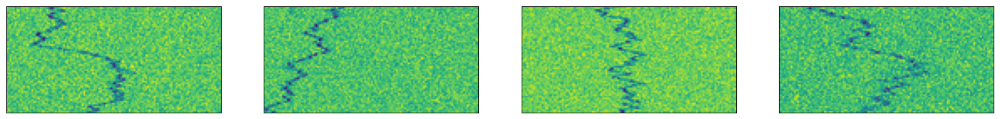

In [66]:
plt.figure(figsize=(20,15))
for i in range(1,5):
    plt.subplot(1,4,i)
    plt.xticks([])
    plt.yticks([])
    plt.imshow(X_train[np.random.randint(0, X_train.shape[0])])

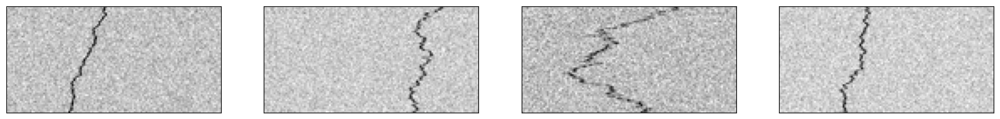

In [67]:
plt.figure(figsize=(20,15))
for i in range(1,5):
    plt.subplot(1,4,i)
    plt.xticks([])
    plt.yticks([])
    plt.imshow(X_train[np.random.randint(0, X_train.shape[0])],cmap="gray")

In [68]:
from tensorflow.keras.preprocessing.image import ImageDataGenerator
train_datagen = ImageDataGenerator(
        horizontal_flip=True)
test_datagen = ImageDataGenerator(
        horizontal_flip=True)
train_datagen.fit(X_train)
test_datagen.fit(X_test)

In [69]:
from tensorflow.keras.layers import Dense, Input, Dropout,Flatten, Conv2D
from tensorflow.keras.layers import BatchNormalization, Activation, MaxPooling2D
from tensorflow.keras.models import Model, Sequential
from tensorflow.keras.optimizers import Adam, SGD
from tensorflow.keras.callbacks import ModelCheckpoint, ReduceLROnPlateau, EarlyStopping
from tensorflow.keras.utils import plot_model

In [70]:
# Initialising the CNN
model = Sequential()
# 1st Convolution
model.add(Conv2D(32 , (5 , 5) , padding = "same" , input_shape = (64 , 128 , 1)))
model.add(BatchNormalization())
model.add(Activation("relu"))
model.add(MaxPooling2D(pool_size = (2 , 2)))
model.add(Dropout(0.25))

# 2nd Convolution layer
model.add(Conv2D(64 , (5 , 5) , padding = "same"))
model.add(BatchNormalization())
model.add(Activation("relu"))
model.add(MaxPooling2D(pool_size = (2 , 2)))
model.add(Dropout(0.25))

# Flattening
model.add(Flatten())

# Fully connected layer
model.add(Dense(1024))
model.add(BatchNormalization())
model.add(Activation("relu"))
model.add(Dropout(0.4))

model.add(Dense(4 , activation="softmax"))

In [71]:
initial_learning_rate = 0.005
lr_schedule = tf.keras.optimizers.schedules.ExponentialDecay(
                initial_learning_rate = initial_learning_rate,
                decay_steps = 5,
                decay_rate = 0.96,
                staircase = True
)
optimizers = Adam(learning_rate = lr_schedule)

In [72]:
model.compile(optimizer = optimizers , loss = "categorical_crossentropy" , metrics = ["accuracy"])
model.summary()

Model: "sequential_1"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ conv2d_2 (Conv2D)               │ (None, 64, 128, 32)    │           832 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_3           │ (None, 64, 128, 32)    │           128 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ activation_3 (Activation)       │ (None, 64, 128, 32)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_2 (MaxPooling2D)  │ (None, 32, 64, 32)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_3 (Dropout)             │ (None, 32, 64, 32)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_3 (Conv2D)               │ (None, 32, 64, 64)     │        51,264 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_4           │ (None, 32, 64, 64)     │           256 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ activation_4 (Activation)       │ (None, 32, 64, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_3 (MaxPooling2D)  │ (None, 16, 32, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_4 (Dropout)             │ (None, 16, 32, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten_1 (Flatten)             │ (None, 32768)          │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2 (Dense)                 │ (None, 1024)           │    33,555,456 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_5           │ (None, 1024)           │         4,096 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ activation_5 (Activation)       │ (None, 1024)           │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_5 (Dropout)             │ (None, 1024)           │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3 (Dense)                 │ (None, 4)              │         4,100 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 33,616,132 (128.24 MB)

 Trainable params: 33,613,892 (128.23 MB)

 Non-trainable params: 2,240 (8.75 KB)

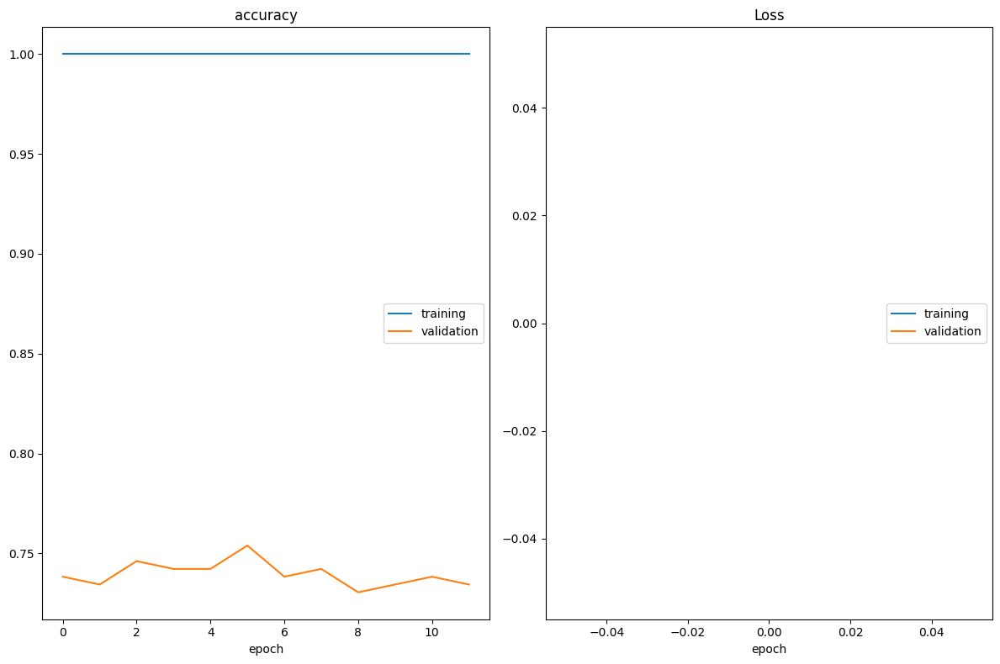

accuracy
	training         	 (min:    1.000, max:    1.000, cur:    1.000)
	validation       	 (min:    0.730, max:    0.754, cur:    0.734)
Loss
	training         	 (min:      nan, max:      nan, cur:      nan)
	validation       	 (min:      nan, max:      nan, cur:      nan)
8/8 ━━━━━━━━━━━━━━━━━━━━ 8s 870ms/step - accuracy: 1.0000 - loss: nan - val_accuracy: 0.7344 - val_loss: nan


In [88]:
from livelossplot import PlotLossesKeras
# Fix mismatches if any
min_train_len = min(len(X_train), len(train_labels))
X_train = X_train[:min_train_len]
train_labels = train_labels[:min_train_len]

min_val_len = min(len(X_test), len(val_labels))
X_test = X_test[:min_val_len]
val_labels = val_labels[:min_val_len]

checkpoint = ModelCheckpoint("model_weight.weights.h5" , monitor = "val_loss" , save_weights_only = True,
                            mode = "min" , verbose = 0)

callbacks = [PlotLossesKeras() , checkpoint]
batch_size = 32

history = model.fit(
        train_datagen.flow(X_train , train_labels , batch_size = batch_size , shuffle = True),
        steps_per_epoch = len(X_train) // batch_size,
        validation_data = test_datagen.flow(X_test , val_labels , batch_size = batch_size , shuffle = True),
        validation_steps = len(X_test) // batch_size,
        epochs = 12,
        callbacks = callbacks
)

In [40]:
!pip install livelossplot

In [90]:
model.evaluate(X_test , val_labels)

9/9 ━━━━━━━━━━━━━━━━━━━━ 3s 261ms/step - accuracy: 0.9150 - loss: nan


[nan, 0.7380073666572571]

In [92]:
from sklearn.metrics import confusion_matrix
from sklearn import metrics

y_true = np.argmax(val_labels , 1)
y_pred = np.argmax(model.predict(X_test) , 1)
print(metrics.classification_report(y_true , y_pred))

9/9 ━━━━━━━━━━━━━━━━━━━━ 3s 290ms/step
              precision    recall  f1-score   support

           0       0.74      1.00      0.85       200
           2       0.00      0.00      0.00        71

    accuracy                           0.74       271
   macro avg       0.37      0.50      0.42       271
weighted avg       0.54      0.74      0.63       271



In [93]:
print("Classification Accuracy: %0.6f" % metrics.accuracy_score(y_true , y_pred))

Classification Accuracy: 0.738007
